In [1]:
import json
import io
import re
import itertools as iter
import numpy as np

# data
import pandas as pd
import geopandas as gpd
# import shapely
import duckdb
import h3
import scalenav
import scalenav.data as snd
import scalenav.scale_nav as sn
from scalenav.plotting import cmap
# from scipy import io as io
# import nctoolkit as nc
# import xarray as xr
# import rioxarray as rx
import glob
import ibis as ib
from ibis import _
ib.options.interactive = True

# plots

# from datashader import transfer_functions as tf, reductions as rd
import pypalettes as pypal
import pydeck as pdk
from seaborn import color_palette

Using angles for meter grid.
Using angles for meter grid.
Using angles for meter grid.
Using angles for meter grid.
Using angles for meter grid.


In [2]:
%pwd

'/Users/cenv1069/Documents/scale_nav/notebook'

In [3]:
# run only once
# moving the working directory into the parent folder
%cd ..

/Users/cenv1069/Documents/scale_nav


In [4]:
processed_data_folder = "outputs/"

### Kummu data set

could be moved to another notebook.

In [5]:
# # trying an interpolation method for the right resolution from a given grid size
# dist = 7500

# alpha = 5/np.log(1_000)

# A = 13 + alpha*np.log(10)

# A 
# alpha
# # 13+alpha*np.log(10)

In [6]:
# 8+alpha*np.log(10_000)

In [7]:

# extra_res = 0
# grid_params = []
# res_params = []

# if dist > 0 : 
#     # extra_res=round(A-np.log(alpha*dist))

#     grid_params = [10,100,1000,5000,10000,dist]
#     grid_params.sort()
    
#     # res_params = [13,12,11,10,8,extra_res]
#     res_params = [round(A-alpha*np.log(size)) for size in grid_params]
#     # res_params.sort(reverse=True)

# else:
#     grid_params = [10,100,1000,5000,10000]
#     res_params = [13,12,11,10,8]

# res_params

# rast_to_h3 = { str(size): {"h3_res" : res, "nn" : [] } for (size,res) in zip(grid_params,res_params)}
# rast_to_h3

In [8]:
grid_param = 7_500

rast_to_h3 = snd.rast_to_h3_map(x=0,y=51,ref="arc",dist=grid_param)

base_res = rast_to_h3[str(grid_param)]["h3_res"]
neighbs = rast_to_h3[str(grid_param)]["nn"]

print("Using base resolution: ",base_res)

Using angles for arc grid.
Using angles for arc grid.
Using angles for arc grid.
Using angles for arc grid.
Using angles for arc grid.
Using angles for arc grid.
Using base resolution:  8


In [9]:
# close up london-oxford
limits = [-1.486,51.138,0.352,51.882]

# wide europe window
# limits = [-14.06,48.34,31.95,59.27]

In [10]:
# gpd.GeoSeries([snd.square_poly(lon=0,lat=51.51,distance=grid_param)],crs="epsg:4326").explore()

In [11]:
layer = ib.read_parquet("outputs/kummu.parquet")

In [12]:
layer.head()

┏━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ lon        ┃ lat     ┃ band        ┃
┡━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━━┩
│ float32    │ float32 │ float32     │
├────────────┼─────────┼─────────────┤
│ -35.625000 │  83.625 │ 13690.28125 │
│ -35.541664 │  83.625 │ 13690.28125 │
│ -34.625000 │  83.625 │ 13690.28125 │
│ -34.541664 │  83.625 │ 13690.28125 │
│ -34.458332 │  83.625 │ 13690.28125 │
└────────────┴─────────┴─────────────┘

<Axes: >

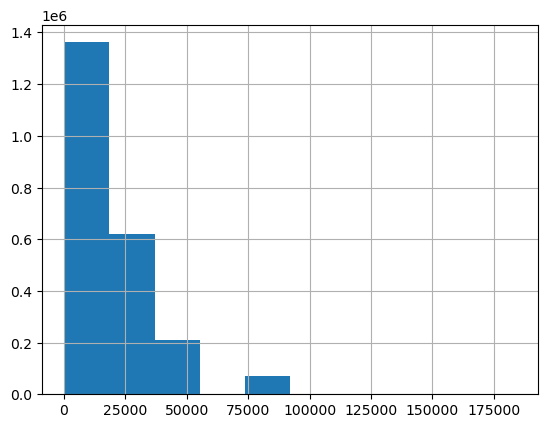

In [13]:
layer.band.to_pandas().hist()

## Fine scale data with CL-tool

In [14]:
#  the coarse resolution file
# ! python -m scalenav.rast_converter /Users/cenv1069/Documents/data/datasets/kummu_etal/GDP_PPP_1990_2015_5arcmin_v2.nc outputs/kummu_5arcmin.parquet

In [15]:
# the fine resolution file 
# At the moment fails
# ! python -m scalenav.rast_converter /Users/cenv1069/Documents/data/datasets/kummu_etal/GDP_PPP_30arcsec_v3.nc outputs/kummu_30arcsec.parquet

In [16]:
layer = (
    ib.read_parquet(f"{processed_data_folder}kummu_5arcmin.parquet")
    .filter(_.lon>limits[0]
            ,_.lon<limits[2]
            ,_.lat>limits[1]
            ,_.lat<limits[3])
    .execute(limit=500_000))

In [17]:
layer.count()

lon     198
lat     198
band    198
dtype: int64

### Deck map

In [18]:
gdp_pc_pal = pypal.load_cmap("Burg",reverse=True)

In [19]:
deck_data = layer#.filter(_.lon>-14.06,_.lon<48.34,_.lat>31.95,_.lat<59.27).execute(limit=500_000)

In [20]:
deck_data["col"] = cmap(deck_data.band,palette=gdp_pc_pal,log=True)

deck_data.head()

Max input : 23.45, palette colors : 7


,lon,lat,band,col
0,-1.458333,51.875,196543968.0,"[244, 163, 168, 255]"
1,-1.375000,51.875,196123520.0,"[244, 163, 168, 255]"
2,-1.291667,51.875,184323072.0,"[244, 163, 168, 255]"
3,-1.208333,51.875,264020336.0,"[244, 163, 168, 255]"
4,-1.125000,51.875,946468544.0,"[255, 198, 196, 255]"


In [21]:
viewstate = pdk.data_utils.compute_view(deck_data[["lon","lat"]])

In [22]:

deck_points = pdk.Layer(type="ScatterplotLayer"
                        ,data=deck_data
                        ,get_position = ["lon","lat"]
                        ,get_radius=200
                        ,get_fill_color= "col"
                        ,pickable=True
                        ,opacity=0.8
                        ,stroked=True
                        ,filled=True
                        ,radius_scale=10
                        ,radius_min_pixels=1
                        ,radius_max_pixels=100
                        ,line_width_min_pixels=1
                        ,get_line_color=[0, 0, 0, 0]
                       )

In [23]:
deck_kummu = pdk.Deck(layers=[deck_points],
                      initial_view_state=viewstate,
                      tooltip= {"text": "Value : {band}"},
                      map_style="road")

In [24]:
deck_kummu.to_html("deck_maps/kummu_vis.html",iframe_height=800)

In [25]:
## Gridding function

In [26]:
# square = snd.square_poly(lat=limits[1],lon=limits[0],distance=grid_param)

# ref_cell = h3.latlng_to_cell(lat=limits[1],lng=limits[0],res=base_res)
# ref_cell_ij = h3.cell_to_local_ij(origin=ref_cell,h=ref_cell)

# cells = h3.geo_to_cells(square,res=base_res)

# cells_ij = [h3.cell_to_local_ij(origin=ref_cell,h=cell) for cell in cells]

# snd.rast_to_h3[str(grid_param)]["nn"] = [(cell_i-ref_cell_ij[0],cell_j-ref_cell_ij[1]) for (cell_i,cell_j) in cells_ij]

# cells_redone = [h3.local_ij_to_cell(origin=ref_cell,i=cells_i+ref_cell_ij[0],j=cells_j+ref_cell_ij[1]) for (cells_i,cells_j) in snd.rast_to_h3[str(grid_param)]["nn"]]

# gpd.GeoSeries([h3.cells_to_h3shape(cells=cells_redone)],crs="epsg:4326").explore()


In [27]:
limits = [-1.486,51.138,0.352,51.882]

# wide europe window
# -14.06
# 48.34
# 31.95
# 59.27

In [28]:
layer.rename(columns={"lon":"x","lat":"y"},inplace=True)

In [29]:
layer.head()

,x,y,band,col
0,-1.458333,51.875,196543968.0,"[244, 163, 168, 255]"
1,-1.375000,51.875,196123520.0,"[244, 163, 168, 255]"
2,-1.291667,51.875,184323072.0,"[244, 163, 168, 255]"
3,-1.208333,51.875,264020336.0,"[244, 163, 168, 255]"
4,-1.125000,51.875,946468544.0,"[255, 198, 196, 255]"


In [30]:
# layer_df = layer.execute(limit=100_000)
layer_df = snd.df_project_on_grid(layer,res=base_res) 
layer_df.head()

,x,y,band,col,h3_id
0,-1.458333,51.875,196543968.0,"[244, 163, 168, 255]",88195d4295fffff
1,-1.375000,51.875,196123520.0,"[244, 163, 168, 255]",88195d5581fffff
2,-1.291667,51.875,184323072.0,"[244, 163, 168, 255]",88195d54c7fffff
3,-1.208333,51.875,264020336.0,"[244, 163, 168, 255]",88195d5693fffff
4,-1.125000,51.875,946468544.0,"[255, 198, 196, 255]",88195d199dfffff


In [31]:
layer_df.rename(columns={"band":"band_var"},inplace=True)

In [32]:
print(layer_df.shape)
layer_df.head()


(198, 5)


,x,y,band_var,col,h3_id
0,-1.458333,51.875,196543968.0,"[244, 163, 168, 255]",88195d4295fffff
1,-1.375000,51.875,196123520.0,"[244, 163, 168, 255]",88195d5581fffff
2,-1.291667,51.875,184323072.0,"[244, 163, 168, 255]",88195d54c7fffff
3,-1.208333,51.875,264020336.0,"[244, 163, 168, 255]",88195d5693fffff
4,-1.125000,51.875,946468544.0,"[255, 198, 196, 255]",88195d199dfffff


In [33]:
neighbs

[(0, -3),
 (5, 2),
 (-4, -4),
 (-4, -6),
 (0, 3),
 (5, 1),
 (5, 5),
 (1, -1),
 (0, -2),
 (5, 8),
 (1, -2),
 (6, 3),
 (4, 4),
 (-5, -6),
 (1, 4),
 (6, 2),
 (3, 6),
 (3, 5),
 (-1, -1),
 (0, -4),
 (4, 3),
 (-4, -5),
 (4, 1),
 (5, 0),
 (7, 1),
 (-5, 1),
 (4, 7),
 (4, 6),
 (0, 0),
 (1, 5),
 (5, 7),
 (1, -3),
 (5, 4),
 (6, 4),
 (-6, -5),
 (3, -1),
 (6, 1),
 (6, 7),
 (-5, -7),
 (-4, 2),
 (3, -2),
 (3, 4),
 (-1, -2),
 (1, 0),
 (8, 2),
 (6, 8),
 (4, 2),
 (5, 6),
 (-5, -4),
 (4, 0),
 (4, -1),
 (-5, -2),
 (4, 5),
 (0, -1),
 (0, 2),
 (5, 3),
 (-6, -6),
 (-8, -3),
 (2, 0),
 (6, 0),
 (2, 6),
 (-6, -4),
 (-1, 0),
 (-5, -5),
 (0, 4),
 (3, 1),
 (-4, 0),
 (8, 3),
 (-6, 0),
 (-5, -3),
 (-1, 4),
 (0, 1),
 (2, -1),
 (-7, -2),
 (-7, -3),
 (-2, 2),
 (-2, 1),
 (7, 5),
 (-2, -1),
 (3, 0),
 (7, 4),
 (-6, -1),
 (3, 3),
 (-1, -3),
 (-6, -2),
 (-1, 3),
 (-1, 2),
 (-3, -3),
 (-8, -1),
 (2, 1),
 (-2, -5),
 (-7, -4),
 (-3, 1),
 (-2, 0),
 (7, 2),
 (6, 6),
 (-2, -2),
 (-6, -7),
 (7, 3),
 (2, 4),
 (-7, 0),
 (-5, -1),
 (

In [34]:
def layer_gridded(layer : pd.DataFrame, neighbs : list[tuple[int]]): 
    
    vars_columns = [x for x in layer.columns if re.search(pattern="_var$",string=x)]

    layer["h3_gridded"] = pd.Series(layer.apply(lambda row: snd.centre_cell_to_square(h3_cell = row["h3_id"],neighbs=neighbs),axis=1).tolist())
    layer.dropna(subset=["h3_gridded"],inplace=True)
    gridded_layer = layer.explode("h3_gridded")
    grid_layer_b = gridded_layer.shape[0]
    gridded_layer = gridded_layer[~gridded_layer.duplicated(subset=["h3_gridded"])]
    grid_layer_a = gridded_layer.shape[0]
    
    print("Duplicated ratio : ",1-np.round(grid_layer_a/grid_layer_b,3))
    
    gridded_layer.reset_index(inplace=True,drop=True)
    gridded_layer.set_index("h3_id",inplace=True,drop=True)
    gridded_layer = gridded_layer.join(gridded_layer.value_counts("h3_id"),how="left",sort=False,validate="m:1")
    gridded_layer[vars_columns] = np.round(gridded_layer[vars_columns].div(gridded_layer["count"],axis=0),3)
    gridded_layer.reset_index(inplace=True,drop=False)
    gridded_layer.dropna(axis=0,subset=["h3_gridded"],inplace=True)

    return gridded_layer

In [35]:
layer_grid = layer_gridded(layer=layer_df,neighbs=neighbs)

Duplicated ratio :  0.379


In [36]:
print(layer_grid.shape)
layer_grid.head()

(16713, 7)


,h3_id,x,y,band_var,col,h3_gridded,count
0,88195d4295fffff,-1.458333,51.875,1445176.235,"[244, 163, 168, 255]",88195d55a7fffff,136
1,88195d4295fffff,-1.458333,51.875,1445176.235,"[244, 163, 168, 255]",88195d42cbfffff,136
2,88195d4295fffff,-1.458333,51.875,1445176.235,"[244, 163, 168, 255]",88195d470dfffff,136
3,88195d4295fffff,-1.458333,51.875,1445176.235,"[244, 163, 168, 255]",88195d4755fffff,136
4,88195d4295fffff,-1.458333,51.875,1445176.235,"[244, 163, 168, 255]",88195d42a3fffff,136


## Mapping gridded

In [37]:
sample_size = np.min([layer_grid.shape[0],200_000])
plotting_layer = layer_grid.sample(sample_size)

In [38]:
plotting_layer["color"] = cmap(plotting_layer["band_var"],palette=gdp_pc_pal,log=False)

Max input : 200961994.10, palette colors : 7


In [39]:
#####

kummu_gridded = pdk.Layer(
    "H3HexagonLayer",
    plotting_layer,
    pickable=True,
    stroked=True,
    filled=True,
    opacity=.5,
    extruded=True,
    elevation_scale = 1e-4,
    elevation_range = [0,100],
    get_elevation="band_var",
    get_hexagon= "h3_gridded",
    get_fill_color = "color",
    get_line_color= [0, 0, 0, 100],
    line_width_min_pixels=0,
    line_width_max_pixels=1,
)


In [40]:
# Create mapdeck object
kummu_gridded_deck = pdk.Deck(layers=[kummu_gridded]
             ,initial_view_state=viewstate
             ,tooltip= {"text": "Value :  {band_var}"}
             ,map_style="road"
             )

kummu_gridded_deck.to_html("deck_maps/kummu_gridded.html",iframe_height=800,open_browser=True)